In [2]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Pytorch-Models
!ls

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
ln: failed to create symbolic link '/mydrive/My Drive': File exists
/content/gdrive/My Drive/Pytorch-Models
checkpoints_unetpp_suim  FPN_Seg.ipynb	       SSD-det.ipynb
coco_eval.py		 MaskRCNN-Seg.ipynb    test
coco_utils.py		 __pycache__	       transforms.py
datasets		 requirements.txt      UNet++_Seg.ipynb
engine.py		 SAM.ipynb	       utils.py
FasterRCNN-det.ipynb	 sam_vit_b_01ec64.pth  vision
FPN_models		 Segformer_models


In [3]:
import os
# Define dataset path in Drive
drive_path = '/content/gdrive/MyDrive/Pytorch-Models/datasets/camvid_data'
os.makedirs(drive_path, exist_ok=True)

# Only download if not already there
if not os.path.exists(os.path.join(drive_path, 'train')):
    %cd /content
    !wget https://github.com/alexgkendall/SegNet-Tutorial/archive/master.zip -O camvid.zip
    !unzip -q camvid.zip
    !mv SegNet-Tutorial-master/CamVid/* "$drive_path"
    !rm -rf SegNet-Tutorial-master camvid.zip
    print("✅ CamVid downloaded and stored in Drive.")
else:
    print("✅ CamVid already exists in Drive.")

/content
--2025-07-07 11:29:48--  https://github.com/alexgkendall/SegNet-Tutorial/archive/master.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/alexgkendall/SegNet-Tutorial/zip/refs/heads/master [following]
--2025-07-07 11:29:48--  https://codeload.github.com/alexgkendall/SegNet-Tutorial/zip/refs/heads/master
Resolving codeload.github.com (codeload.github.com)... 20.205.243.165
Connecting to codeload.github.com (codeload.github.com)|20.205.243.165|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘camvid.zip’

camvid.zip              [            <=>     ] 178.41M  17.4MB/s    in 11s     

2025-07-07 11:29:59 (16.9 MB/s) - ‘camvid.zip’ saved [187075221]

✅ CamVid downloaded and stored in Drive.


In [2]:
%cd /mydrive/Pytorch-Models

/content/gdrive/My Drive/Pytorch-Models


In [6]:
import os
import json

def count_images(image_dir, exts={".jpg", ".jpeg", ".png", ".bmp", ".webp"}):
    image_count = 0
    for filename in os.listdir(image_dir):
        if os.path.splitext(filename.lower())[1] in exts:
            image_count += 1
    print(f"Total images: {image_count}")

count_images("datasets/camvid_data/train")
count_images("datasets/camvid_data/trainannot")
count_images("datasets/camvid_data/val")
count_images("datasets/camvid_data/valannot")
count_images("datasets/camvid_data/test")
count_images("datasets/camvid_data/testannot")

Total images: 367
Total images: 367
Total images: 101
Total images: 101
Total images: 233
Total images: 233


In [19]:
import os
import numpy as np
from PIL import Image

def check_semantic_ids(semantic_dir):
    all_ids = set()
    for filename in os.listdir(semantic_dir):
        if filename.endswith(".png"):
            mask = np.array(Image.open(os.path.join(semantic_dir, filename)))
            unique_ids = np.unique(mask)
            all_ids.update(unique_ids.tolist())
    return sorted(all_ids)

semantic_dir = "datasets/camvid_data/trainannot"  # or train folder
unique_ids = check_semantic_ids(semantic_dir)
print("Unique semantic IDs found:", unique_ids)

Unique semantic IDs found: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 255]


In [21]:
import numpy as np
from PIL import Image
import os
from tqdm import tqdm

mask_dir = "datasets/camvid_data/testannot"

for fname in tqdm(os.listdir(mask_dir), desc="Fixing masks"):
    path = os.path.join(mask_dir, fname)
    mask = np.array(Image.open(path))

    # Remap 11 → 255 (ignore index)
    mask[mask == 11] = 255

    # Save back safely (overwrite or save to new folder)
    Image.fromarray(mask).save(path)

Fixing masks: 100%|██████████| 233/233 [00:02<00:00, 92.63it/s]


In [22]:
import os
import numpy as np
from PIL import Image
from tqdm import tqdm

# Update this to valannot or testannot if needed
mask_dir = "datasets/camvid_data/trainannot"

# CamVid class ID to label mapping
class_labels = {
    0: "Sky",
    1: "Building",
    2: "Pole",
    3: "Road",
    4: "Pavement",
    5: "Tree",
    6: "SignSymbol",
    7: "Fence",
    8: "Car",
    9: "Pedestrian",
    10: "Bicyclist"
}

# Only count class indices 0–10 (CamVid has 11 classes); ignore 255
valid_classes = set(class_labels.keys())

# For storing which classes are present in each image
image_class_presence = {}

# Count how many images each class appears in
class_occurrence = {cls: 0 for cls in valid_classes}

for mask_filename in tqdm(os.listdir(mask_dir), desc="Scanning masks"):
    mask_path = os.path.join(mask_dir, mask_filename)
    if not mask_path.lower().endswith((".png", ".jpg", ".bmp")):
        continue

    mask = np.array(Image.open(mask_path))

    # Get unique class indices in this mask
    unique_classes = np.unique(mask)

    # Filter out ignored label (255)
    filtered_classes = set([cls for cls in unique_classes if cls in valid_classes])
    image_class_presence[mask_filename] = filtered_classes

    # Update class occurrence counter
    for cls in filtered_classes:
        class_occurrence[cls] += 1

# Display results
print(f"\nClass presence across {len(image_class_presence)} images:")
for cls, count in sorted(class_occurrence.items()):
    label = class_labels.get(cls, "Unknown")
    print(f"  Class {cls} ({label}): {count} images")

Scanning masks: 100%|██████████| 367/367 [00:01<00:00, 224.97it/s]


Class presence across 367 images:
  Class 0 (Sky): 366 images
  Class 1 (Building): 365 images
  Class 2 (Pole): 366 images
  Class 3 (Road): 367 images
  Class 4 (Pavement): 349 images
  Class 5 (Tree): 319 images
  Class 6 (SignSymbol): 351 images
  Class 7 (Fence): 173 images
  Class 8 (Car): 360 images
  Class 9 (Pedestrian): 317 images
  Class 10 (Bicyclist): 201 images


In [3]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

In [ ]:
!pip install segmentation-models-pytorch albumentations

In [ ]:
!pip install timm

In [4]:
import os
import json
import numpy as np
import random
from tqdm import tqdm
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from torch.utils.data import Dataset
import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from segmentation_models_pytorch.utils import losses, metrics
from sklearn.metrics import precision_score, recall_score, f1_score

In [5]:
class CamVidDataset(Dataset):
    def __init__(self, image_dir, mask_dir, image_size=(640, 640), is_train=True):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_size = image_size
        self.is_train = is_train

        self.images = sorted([
            f for f in os.listdir(image_dir)
            if f.lower().endswith(('.png', '.jpg'))
        ])

        self.transform = self.get_transform()

    def get_transform(self):
        if self.is_train:
            return A.Compose([
                A.HorizontalFlip(p=0.5),
                A.RandomBrightnessContrast(p=0.3),
                A.HueSaturationValue(p=0.3),
                A.ShiftScaleRotate(shift_limit=0.02, scale_limit=0.05, rotate_limit=5, p=0.5),
                A.Resize(*self.image_size),
                A.Normalize(mean=(0.485, 0.456, 0.406),
                            std=(0.229, 0.224, 0.225)),
                ToTensorV2()
            ])
        else:
            return A.Compose([
                A.Resize(*self.image_size),
                A.Normalize(mean=(0.485, 0.456, 0.406),
                            std=(0.229, 0.224, 0.225)),
                ToTensorV2()
            ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        img_path = os.path.join(self.image_dir, img_name)
        mask_path = os.path.join(self.mask_dir, img_name)

        image = np.array(Image.open(img_path).convert("RGB"))
        mask = np.array(Image.open(mask_path)).astype(np.uint8)

        transformed = self.transform(image=image, mask=mask)
        image = transformed["image"]
        mask = transformed["mask"].long()

        return image, mask

In [7]:
train_set = CamVidDataset(
    image_dir="datasets/camvid_data/train",
    mask_dir="datasets/camvid_data/trainannot",
    is_train=True
)

val_set = CamVidDataset(
    image_dir="datasets/camvid_data/val",
    mask_dir="datasets/camvid_data/valannot",
    is_train=False
)

train_loader = DataLoader(train_set, batch_size=4, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_set, batch_size=4, shuffle=False, num_workers=4, pin_memory=True)

In [21]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

# CamVid classes and colors
CLASS_NAMES = {
    0: "Sky",
    1: "Building",
    2: "Pole",
    3: "Road",
    4: "Pavement",
    5: "Tree",
    6: "SignSymbol",
    7: "Fence",
    8: "Car",
    9: "Pedestrian",
    10: "Bicyclist"
}

CLASS_COLORS = np.array([
    [135, 206, 235],   # 0 Sky - sky blue
    [128, 128, 128],   # 1 Building - neutral gray
    [255, 215, 0],     # 2 Pole - golden yellow
    [128, 64, 128],    # 3 Road - dark muted purple (standard road color)
    [210, 180, 140],   # 4 Pavement - tan/light brown
    [34, 139, 34],     # 5 Tree - forest green
    [255, 140, 0],     # 6 SignSymbol - dark orange (warning signs)
    [139, 69, 19],     # 7 Fence - saddle brown (wood color)
    [220, 20, 60],     # 8 Car - crimson red (car color)
    [255, 20, 147],    # 9 Pedestrian - deep pink (people stand out)
    [0, 191, 255]      # 10 Bicyclist - deep sky blue
], dtype=np.uint8)

def unnormalize(image_tensor):
    """Unnormalize ImageNet-normalized tensor to [0,1] numpy array for display."""
    image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
    image_np = (image_np * IMAGENET_STD) + IMAGENET_MEAN
    image_np = np.clip(image_np, 0, 1)
    return image_np

def decode_mask(mask_np):
    """Convert grayscale mask of class indices to RGB color mask."""
    h, w = mask_np.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for class_idx, color in enumerate(CLASS_COLORS):
        color_mask[mask_np == class_idx] = color
    return color_mask

def visualize_two_samples(dataset, idx1, idx2):
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))

    for i, idx in enumerate([idx1, idx2]):
        image, mask = dataset[idx]

        # Unnormalize image
        image_np = unnormalize(image)

        # Decode mask to RGB
        mask_np = mask.cpu().numpy()
        color_mask = decode_mask(mask_np)

        # Print unique classes
        unique_classes = np.unique(mask_np)
        print(f"\nSample {idx} contains classes:")
        for c in unique_classes:
            class_name = CLASS_NAMES.get(c, f"Class {c}")
            print(f"  - ID {c}: {class_name}")

        # Plot original image
        axs[i * 2].imshow(image_np)
        axs[i * 2].set_title(f"Image {idx}")
        axs[i * 2].axis('off')

        # Plot color-coded mask
        axs[i * 2 + 1].imshow(color_mask)
        axs[i * 2 + 1].set_title(f"GT Mask {idx}")
        axs[i * 2 + 1].axis('off')

    plt.tight_layout()
    plt.show()


Sample 100 contains classes:
  - ID 0: Sky
  - ID 1: Building
  - ID 2: Pole
  - ID 3: Road
  - ID 4: Pavement
  - ID 5: Tree
  - ID 6: SignSymbol
  - ID 7: Fence
  - ID 8: Car
  - ID 255: Class 255

Sample 155 contains classes:
  - ID 0: Sky
  - ID 1: Building
  - ID 2: Pole
  - ID 3: Road
  - ID 4: Pavement
  - ID 5: Tree
  - ID 6: SignSymbol
  - ID 7: Fence
  - ID 8: Car
  - ID 9: Pedestrian
  - ID 10: Bicyclist
  - ID 255: Class 255


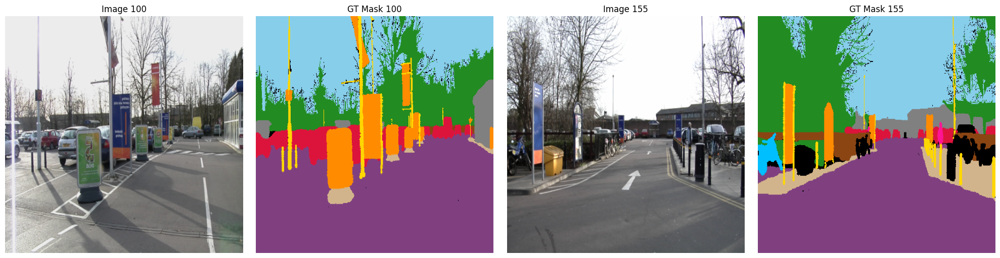

In [58]:
visualize_two_samples(train_set, 100, 155)

In [85]:
# === Model ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = smp.FPN(
    encoder_name="resnet101",
    encoder_weights="imagenet",
    in_channels=3,
    classes=11,
    activation=None
).to(device)
model = model.to(device)

In [ ]:
!pip install torchmetrics

In [9]:
# === Model ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelT = smp.Segformer(
    encoder_name="mit_b3",      # choose MiT-B3 backbone for good trade-off
    encoder_weights="imagenet",
    classes=11,
    activation=None
).to(device)
modelT = modelT.to(device)

In [10]:
# Losses
dice_loss = smp.losses.DiceLoss(mode='multiclass', ignore_index=255)
ce_loss = nn.CrossEntropyLoss(ignore_index=255)

def combined_loss(preds, targets):
    return dice_loss(preds, targets) + ce_loss(preds, targets)

# Optimizer
#optimizer = optim.Adam(model.parameters(), lr=1e-4)
optimizer = optim.Adam(modelT.parameters(), lr=1e-4)

In [87]:
# === Mean IoU Validator ===
def validate_for_mean_iou(val_loader, model, num_classes=11, ignore_index=255, device='cuda'):
    model.eval()
    total_inter = np.zeros(num_classes)
    total_union = np.zeros(num_classes)

    with torch.no_grad():
        for images, masks in tqdm(val_loader, desc="Validating (Mean IoU)"):
            images = images.to(device)
            masks = masks.to(device)

            preds = model(images)
            preds = preds.argmax(dim=1)

            for cls in range(num_classes):
                pred_mask = (preds == cls)
                true_mask = (masks == cls)
                valid_mask = (masks != ignore_index)

                pred_mask = pred_mask & valid_mask
                true_mask = true_mask & valid_mask

                inter = (pred_mask & true_mask).sum().item()
                union = (pred_mask | true_mask).sum().item()

                total_inter[cls] += inter
                total_union[cls] += union

    per_class_iou = np.divide(
        total_inter, total_union,
        out=np.zeros_like(total_inter),
        where=total_union != 0
    )
    mean_iou = per_class_iou.mean()
    return mean_iou

# === Training Loop ===
best_iou = 0.0
num_epochs = 20

save_dir = "FPN_models"
os.makedirs(save_dir, exist_ok=True)
save_path = os.path.join(save_dir, "best_fpn_camvid.pth")

for epoch in range(1, num_epochs + 1):
    # --- Train ---
    model.train()
    total_loss = 0.0

    for images, masks in tqdm(train_loader, desc=f"Training Epoch {epoch}"):
        images = images.to(device)
        masks = masks.to(device)

        preds = model(images)
        loss = combined_loss(preds, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_train_loss = total_loss / len(train_loader)

    # --- Validate ---
    val_iou = validate_for_mean_iou(val_loader, model, num_classes=11, device=device)
    print(f"Epoch {epoch}/{num_epochs} - Train Loss: {avg_train_loss:.4f} - Mean Val IoU: {val_iou:.4f}")

    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(model.state_dict(), save_path)
        print(f"** Saved best model with Mean IoU: {best_iou:.4f} **")

Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.38it/s]


Epoch 1/20 - Train Loss: 1.2907 - Mean Val IoU: 0.5720
** Saved best model with Mean IoU: 0.5720 **


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]


Epoch 2/20 - Train Loss: 0.7225 - Mean Val IoU: 0.6360
** Saved best model with Mean IoU: 0.6360 **


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.35it/s]


Epoch 3/20 - Train Loss: 0.6111 - Mean Val IoU: 0.6672
** Saved best model with Mean IoU: 0.6672 **


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.33it/s]


Epoch 4/20 - Train Loss: 0.5382 - Mean Val IoU: 0.6615


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]


Epoch 5/20 - Train Loss: 0.4967 - Mean Val IoU: 0.7015
** Saved best model with Mean IoU: 0.7015 **


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]


Epoch 6/20 - Train Loss: 0.4804 - Mean Val IoU: 0.6665


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.35it/s]


Epoch 7/20 - Train Loss: 0.4382 - Mean Val IoU: 0.7293
** Saved best model with Mean IoU: 0.7293 **


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]


Epoch 8/20 - Train Loss: 0.3982 - Mean Val IoU: 0.7297
** Saved best model with Mean IoU: 0.7297 **


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.31it/s]


Epoch 9/20 - Train Loss: 0.3920 - Mean Val IoU: 0.7305
** Saved best model with Mean IoU: 0.7305 **


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.35it/s]


Epoch 10/20 - Train Loss: 0.3629 - Mean Val IoU: 0.7410
** Saved best model with Mean IoU: 0.7410 **


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.37it/s]


Epoch 11/20 - Train Loss: 0.3447 - Mean Val IoU: 0.7449
** Saved best model with Mean IoU: 0.7449 **


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]


Epoch 12/20 - Train Loss: 0.3320 - Mean Val IoU: 0.7498
** Saved best model with Mean IoU: 0.7498 **


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.33it/s]


Epoch 13/20 - Train Loss: 0.3277 - Mean Val IoU: 0.7429


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]


Epoch 14/20 - Train Loss: 0.3265 - Mean Val IoU: 0.7433


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Epoch 15/20 - Train Loss: 0.3407 - Mean Val IoU: 0.7152


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]


Epoch 16/20 - Train Loss: 0.3235 - Mean Val IoU: 0.7495


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.35it/s]


Epoch 17/20 - Train Loss: 0.3107 - Mean Val IoU: 0.7465


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.33it/s]


Epoch 18/20 - Train Loss: 0.2942 - Mean Val IoU: 0.7573
** Saved best model with Mean IoU: 0.7573 **


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.33it/s]


Epoch 19/20 - Train Loss: 0.2879 - Mean Val IoU: 0.7612
** Saved best model with Mean IoU: 0.7612 **


Validating (Mean IoU): 100%|██████████| 13/13 [00:05<00:00,  2.33it/s]


Epoch 20/20 - Train Loss: 0.2773 - Mean Val IoU: 0.7672
** Saved best model with Mean IoU: 0.7672 **


In [11]:
# === Mean IoU Validator ===
def validate_for_mean_iou(val_loader, modelT, num_classes=11, ignore_index=255, device='cuda'):
    modelT.eval()
    total_inter = np.zeros(num_classes)
    total_union = np.zeros(num_classes)

    with torch.no_grad():
        for images, masks in tqdm(val_loader, desc="Validating (Mean IoU)"):
            images = images.to(device)
            masks = masks.to(device)

            preds = modelT(images)
            preds = preds.argmax(dim=1)

            for cls in range(num_classes):
                pred_mask = (preds == cls)
                true_mask = (masks == cls)
                valid_mask = (masks != ignore_index)

                pred_mask = pred_mask & valid_mask
                true_mask = true_mask & valid_mask

                inter = (pred_mask & true_mask).sum().item()
                union = (pred_mask | true_mask).sum().item()

                total_inter[cls] += inter
                total_union[cls] += union

    per_class_iou = np.divide(
        total_inter, total_union,
        out=np.zeros_like(total_inter),
        where=total_union != 0
    )
    mean_iou = per_class_iou.mean()
    return mean_iou

# === Training Loop ===
best_iou = 0.0
num_epochs = 20

save_dir = "Segformer_models"
os.makedirs(save_dir, exist_ok=True)
save_path = os.path.join(save_dir, "best_segformer_camvid.pth")

for epoch in range(1, num_epochs + 1):
    # --- Train ---
    modelT.train()
    total_loss = 0.0

    for images, masks in tqdm(train_loader, desc=f"Training Epoch {epoch}"):
        images = images.to(device)
        masks = masks.to(device)

        preds = modelT(images)
        loss = combined_loss(preds, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_train_loss = total_loss / len(train_loader)

    # --- Validate ---
    val_iou = validate_for_mean_iou(val_loader, modelT, num_classes=11, device=device)
    print(f"Epoch {epoch}/{num_epochs} - Train Loss: {avg_train_loss:.4f} - Mean Val IoU: {val_iou:.4f}")

    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(modelT.state_dict(), save_path)
        print(f"** Saved best model with Mean IoU: {best_iou:.4f} **")

Validating (Mean IoU): 100%|██████████| 26/26 [00:37<00:00,  1.43s/it]


Epoch 1/20 - Train Loss: 0.9851 - Mean Val IoU: 0.6299
** Saved best model with Mean IoU: 0.6299 **


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.10it/s]


Epoch 2/20 - Train Loss: 0.5790 - Mean Val IoU: 0.7151
** Saved best model with Mean IoU: 0.7151 **


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.15it/s]


Epoch 3/20 - Train Loss: 0.4833 - Mean Val IoU: 0.7062


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.14it/s]


Epoch 4/20 - Train Loss: 0.4325 - Mean Val IoU: 0.7425
** Saved best model with Mean IoU: 0.7425 **


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.13it/s]


Epoch 5/20 - Train Loss: 0.3976 - Mean Val IoU: 0.7603
** Saved best model with Mean IoU: 0.7603 **


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.14it/s]


Epoch 6/20 - Train Loss: 0.3621 - Mean Val IoU: 0.7706
** Saved best model with Mean IoU: 0.7706 **


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.13it/s]


Epoch 7/20 - Train Loss: 0.3486 - Mean Val IoU: 0.7686


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.12it/s]


Epoch 8/20 - Train Loss: 0.3383 - Mean Val IoU: 0.7536


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.13it/s]


Epoch 9/20 - Train Loss: 0.3231 - Mean Val IoU: 0.7821
** Saved best model with Mean IoU: 0.7821 **


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.14it/s]


Epoch 10/20 - Train Loss: 0.3151 - Mean Val IoU: 0.7839
** Saved best model with Mean IoU: 0.7839 **


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.12it/s]


Epoch 11/20 - Train Loss: 0.3006 - Mean Val IoU: 0.7878
** Saved best model with Mean IoU: 0.7878 **


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.14it/s]


Epoch 12/20 - Train Loss: 0.2882 - Mean Val IoU: 0.7853


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.14it/s]


Epoch 13/20 - Train Loss: 0.2911 - Mean Val IoU: 0.7835


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.14it/s]


Epoch 14/20 - Train Loss: 0.2882 - Mean Val IoU: 0.7873


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.12it/s]


Epoch 15/20 - Train Loss: 0.2734 - Mean Val IoU: 0.7855


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.13it/s]


Epoch 16/20 - Train Loss: 0.2634 - Mean Val IoU: 0.7918
** Saved best model with Mean IoU: 0.7918 **


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.13it/s]


Epoch 17/20 - Train Loss: 0.2598 - Mean Val IoU: 0.7913


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.13it/s]


Epoch 18/20 - Train Loss: 0.2502 - Mean Val IoU: 0.7980
** Saved best model with Mean IoU: 0.7980 **


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.12it/s]


Epoch 19/20 - Train Loss: 0.2490 - Mean Val IoU: 0.7963


Validating (Mean IoU): 100%|██████████| 26/26 [00:08<00:00,  3.12it/s]

Epoch 20/20 - Train Loss: 0.2427 - Mean Val IoU: 0.7924


In [17]:
import torch

model = smp.FPN(
    encoder_name="resnet101",
    encoder_weights=None,
    in_channels=3,
    classes=11,
    activation=None
).to(device)
model.load_state_dict(torch.load("FPN_models/best_fpn_camvid.pth"))
model = model.to(device)
model.eval()

FPN(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
       

In [12]:
import torch

modelT = smp.Segformer(
    encoder_name="mit_b3",
    encoder_weights=None,
    classes=11,
    activation=None
).to(device)
modelT.load_state_dict(torch.load("Segformer_models/best_segformer_camvid.pth"))
modelT = modelT.to(device)
modelT.eval()

Segformer(
  (encoder): MixVisionTransformerEncoder(
    (patch_embed1): OverlapPatchEmbed(
      (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
      (norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed2): OverlapPatchEmbed(
      (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed3): OverlapPatchEmbed(
      (proj): Conv2d(128, 320, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed4): OverlapPatchEmbed(
      (proj): Conv2d(320, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
    )
    (block1): Sequential(
      (0): Block(
        (norm1): LayerNorm((64,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (q): Linear(in_featur

In [13]:
def evaluate_model(model, dataloader, num_classes=11, ignore_index=255, device='cuda'):
    import numpy as np
    from tqdm import tqdm

    CLASS_NAMES = {
        0: "Sky",
        1: "Building",
        2: "Pole",
        3: "Road",
        4: "Pavement",
        5: "Tree",
        6: "SignSymbol",
        7: "Fence",
        8: "Car",
        9: "Pedestrian",
        10: "Bicyclist"
    }

    model.eval()

    total_inter = np.zeros(num_classes)
    total_union = np.zeros(num_classes)
    total_tp = np.zeros(num_classes)
    total_fp = np.zeros(num_classes)
    total_fn = np.zeros(num_classes)

    total_global_inter = 0
    total_global_union = 0

    with torch.no_grad():
        for images, masks in tqdm(dataloader, desc="Evaluating"):
            images = images.to(device)
            masks = masks.to(device)

            preds = model(images)
            preds = preds.argmax(dim=1)

            valid_mask = (masks != ignore_index)

            total_global_inter += ((preds == masks) & valid_mask).sum().item()
            total_global_union += valid_mask.sum().item()

            for cls in range(num_classes):
                pred_inds = (preds == cls)
                target_inds = (masks == cls)

                pred_inds = pred_inds & valid_mask
                target_inds = target_inds & valid_mask

                intersection = (pred_inds & target_inds).sum().item()
                union = (pred_inds | target_inds).sum().item()
                total_inter[cls] += intersection
                total_union[cls] += union

                tp = intersection
                fp = (pred_inds & ~target_inds).sum().item()
                fn = (~pred_inds & target_inds).sum().item()

                total_tp[cls] += tp
                total_fp[cls] += fp
                total_fn[cls] += fn

    results = {}

    header = "{:<6} {:<20} {:>8} {:>10} {:>10} {:>8}"
    row_fmt = "{:<6} {:<20} {:>8.4f} {:>10.4f} {:>10.4f} {:>8.4f}"
    print("\n📊 Per-Class Evaluation Metrics:\n")
    print(header.format("Class", "Class Name", "IoU", "Precision", "Recall", "F1"))

    for cls in range(num_classes):
        iou = total_inter[cls] / total_union[cls] if total_union[cls] > 0 else 0
        precision = total_tp[cls] / (total_tp[cls] + total_fp[cls]) if (total_tp[cls] + total_fp[cls]) > 0 else 0
        recall = total_tp[cls] / (total_tp[cls] + total_fn[cls]) if (total_tp[cls] + total_fn[cls]) > 0 else 0
        f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

        class_name = CLASS_NAMES.get(cls, f"Class {cls}")

        print(row_fmt.format(cls, class_name, iou, precision, recall, f1))

        results[cls] = {
            "IoU": iou,
            "Precision": precision,
            "Recall": recall,
            "F1": f1
        }

    mean_iou = np.mean([v["IoU"] for v in results.values()])
    global_iou = total_global_inter / total_global_union if total_global_union > 0 else 0

    print(f"\n🔹 Mean IoU (per-class average): {mean_iou:.4f}")
    print(f"🔸 Global IoU (pixel-wise accuracy over valid classes): {global_iou:.4f}")

    return results, mean_iou, global_iou

In [90]:
results, mean_iou, global_iou = evaluate_model(model, val_loader, num_classes=11, device=device)

Evaluating: 100%|██████████| 13/13 [00:05<00:00,  2.33it/s]


📊 Per-Class Evaluation Metrics:

Class  Class Name                IoU  Precision     Recall       F1
0      Sky                    0.9399     0.9759     0.9623   0.9690
1      Building               0.9089     0.9587     0.9460   0.9523
2      Pole                   0.1111     0.4277     0.1305   0.2000
3      Road                   0.9714     0.9912     0.9798   0.9855
4      Pavement               0.8891     0.9226     0.9607   0.9413
5      Tree                   0.9151     0.9355     0.9767   0.9557
6      SignSymbol             0.6451     0.8542     0.7248   0.7842
7      Fence                  0.7388     0.8356     0.8644   0.8498
8      Car                    0.8786     0.9401     0.9308   0.9354
9      Pedestrian             0.6221     0.6968     0.8531   0.7671
10     Bicyclist              0.8191     0.8966     0.9046   0.9005

🔹 Mean IoU (per-class average): 0.7672
🔸 Global IoU (pixel-wise accuracy over valid classes): 0.9528


In [14]:
results, mean_iou, global_iou = evaluate_model(modelT, val_loader, num_classes=11, device=device)

Evaluating: 100%|██████████| 26/26 [00:07<00:00,  3.26it/s]


📊 Per-Class Evaluation Metrics:

Class  Class Name                IoU  Precision     Recall       F1
0      Sky                    0.9423     0.9727     0.9679   0.9703
1      Building               0.9243     0.9662     0.9553   0.9607
2      Pole                   0.1775     0.4796     0.2198   0.3015
3      Road                   0.9739     0.9912     0.9824   0.9868
4      Pavement               0.8997     0.9299     0.9651   0.9472
5      Tree                   0.9243     0.9396     0.9827   0.9607
6      SignSymbol             0.7127     0.8650     0.8019   0.8322
7      Fence                  0.7998     0.9176     0.8617   0.8888
8      Car                    0.9086     0.9502     0.9540   0.9521
9      Pedestrian             0.6636     0.7373     0.8690   0.7978
10     Bicyclist              0.8507     0.9294     0.9094   0.9193

🔹 Mean IoU (per-class average): 0.7980
🔸 Global IoU (pixel-wise accuracy over valid classes): 0.9597


In [15]:
test_set = CamVidDataset(
    image_dir="datasets/camvid_data/test",
    mask_dir="datasets/camvid_data/testannot",
    is_train=False
)
test_loader = DataLoader(test_set, batch_size=4, shuffle=False, num_workers=4, pin_memory=True)

In [93]:
results, mean_iou, global_iou = evaluate_model(model, test_loader, num_classes=11, device=device)

Evaluating: 100%|██████████| 30/30 [00:12<00:00,  2.42it/s]


📊 Per-Class Evaluation Metrics:

Class  Class Name                IoU  Precision     Recall       F1
0      Sky                    0.9136     0.9692     0.9409   0.9549
1      Building               0.8369     0.8986     0.9242   0.9112
2      Pole                   0.2747     0.5767     0.3441   0.4310
3      Road                   0.9512     0.9740     0.9760   0.9750
4      Pavement               0.8436     0.9020     0.9287   0.9152
5      Tree                   0.7740     0.8454     0.9016   0.8726
6      SignSymbol             0.5145     0.7220     0.6416   0.6795
7      Fence                  0.4484     0.7390     0.5327   0.6191
8      Car                    0.8127     0.9475     0.8509   0.8966
9      Pedestrian             0.5702     0.6887     0.7682   0.7263
10     Bicyclist              0.5943     0.8090     0.6913   0.7455

🔹 Mean IoU (per-class average): 0.6849
🔸 Global IoU (pixel-wise accuracy over valid classes): 0.9194


In [16]:
results, mean_iou, global_iou = evaluate_model(modelT, test_loader, num_classes=11, device=device)

Evaluating: 100%|██████████| 59/59 [01:16<00:00,  1.30s/it]


📊 Per-Class Evaluation Metrics:

Class  Class Name                IoU  Precision     Recall       F1
0      Sky                    0.9225     0.9608     0.9586   0.9597
1      Building               0.8517     0.9029     0.9375   0.9199
2      Pole                   0.3273     0.5780     0.4301   0.4932
3      Road                   0.9429     0.9634     0.9779   0.9706
4      Pavement               0.8279     0.9117     0.9001   0.9059
5      Tree                   0.7943     0.8746     0.8965   0.8854
6      SignSymbol             0.5434     0.7687     0.6496   0.7041
7      Fence                  0.3366     0.8263     0.3623   0.5037
8      Car                    0.8229     0.9578     0.8538   0.9028
9      Pedestrian             0.6279     0.7126     0.8408   0.7714
10     Bicyclist              0.6647     0.8411     0.7602   0.7986

🔹 Mean IoU (per-class average): 0.6966
🔸 Global IoU (pixel-wise accuracy over valid classes): 0.9229


In [18]:
def overlay_mask_on_image(image_np, mask_np, alpha=0.4):
    """Overlay color mask onto original image"""
    color_mask = decode_mask(mask_np)
    overlay = (image_np * 255).astype(np.uint8).copy()
    overlay = (overlay * (1 - alpha) + color_mask * alpha).astype(np.uint8)
    return overlay

def add_class_labels_to_overlay(overlay, mask_np, min_area=100):
    """Draw class labels on overlay image at approximate locations with white box background,
       but skip very small masks (area < min_area pixels)."""
    unique_classes = np.unique(mask_np)
    h, w, _ = overlay.shape

    for class_id in unique_classes:
        if class_id == 255:
            continue  # Skip ignore index
        class_name = CLASS_NAMES.get(class_id, f"Class {class_id}")

        # Find all pixel locations for this class
        ys, xs = np.where(mask_np == class_id)
        area = len(xs)

        if area < min_area:
            continue  # Skip small objects

        # Choose central point
        center_x = int(np.mean(xs))
        center_y = int(np.mean(ys))

        # Calculate text size
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.5
        thickness = 1
        text_size, _ = cv2.getTextSize(class_name, font, font_scale, thickness)
        text_w, text_h = text_size

        # Draw white rectangle background
        box_coords = (
            center_x,
            center_y - text_h - 2,
            center_x + text_w + 2,
            center_y
        )
        cv2.rectangle(
            overlay,
            (box_coords[0], box_coords[1]),
            (box_coords[2], box_coords[3]),
            (255, 255, 255),
            thickness=-1
        )

        # Draw black text over white box
        cv2.putText(
            overlay,
            class_name,
            (center_x + 1, center_y - 2),
            font,
            font_scale,
            (0, 0, 0),
            thickness,
            cv2.LINE_AA
        )

    return overlay

In [29]:
def visualize_predictions_with_overlay(data_loader, model=model, device=device, num_images=5, min_area=100):
    model.eval()
    all_images = []
    all_masks = []

    # Load all images and masks
    with torch.no_grad():
        for images, masks in data_loader:
            all_images.append(images)
            all_masks.append(masks)
    all_images = torch.cat(all_images, dim=0)
    all_masks = torch.cat(all_masks, dim=0)

    total_samples = all_images.shape[0]
    selected_indices = random.sample(range(total_samples), min(num_images, total_samples))

    fig, axs = plt.subplots(len(selected_indices), 4, figsize=(20, 5 * len(selected_indices)))

    if len(selected_indices) == 1:
        axs = np.expand_dims(axs, axis=0)  # Ensure 2D axs for single row

    with torch.no_grad():
        for row_idx, idx in enumerate(selected_indices):
            image = all_images[idx].to(device).unsqueeze(0)
            output = model(image)
            pred_mask = torch.argmax(output, dim=1).cpu().squeeze(0).numpy()

            img_np = unnormalize(all_images[idx])
            gt_mask_np = all_masks[idx].cpu().numpy()

            overlay_np = overlay_mask_on_image(img_np, pred_mask)
            overlay_np = add_class_labels_to_overlay(overlay_np, pred_mask, min_area=min_area)

            axs[row_idx, 0].imshow(img_np)
            axs[row_idx, 0].set_title("Original Image")
            axs[row_idx, 0].axis('off')

            axs[row_idx, 1].imshow(decode_mask(gt_mask_np))
            axs[row_idx, 1].set_title("Ground Truth")
            axs[row_idx, 1].axis('off')

            axs[row_idx, 2].imshow(decode_mask(pred_mask))
            axs[row_idx, 2].set_title("Prediction")
            axs[row_idx, 2].axis('off')

            axs[row_idx, 3].imshow(overlay_np)
            axs[row_idx, 3].set_title("Overlay + Labels")
            axs[row_idx, 3].axis('off')

    plt.tight_layout()
    plt.show()
    plt.close(fig)

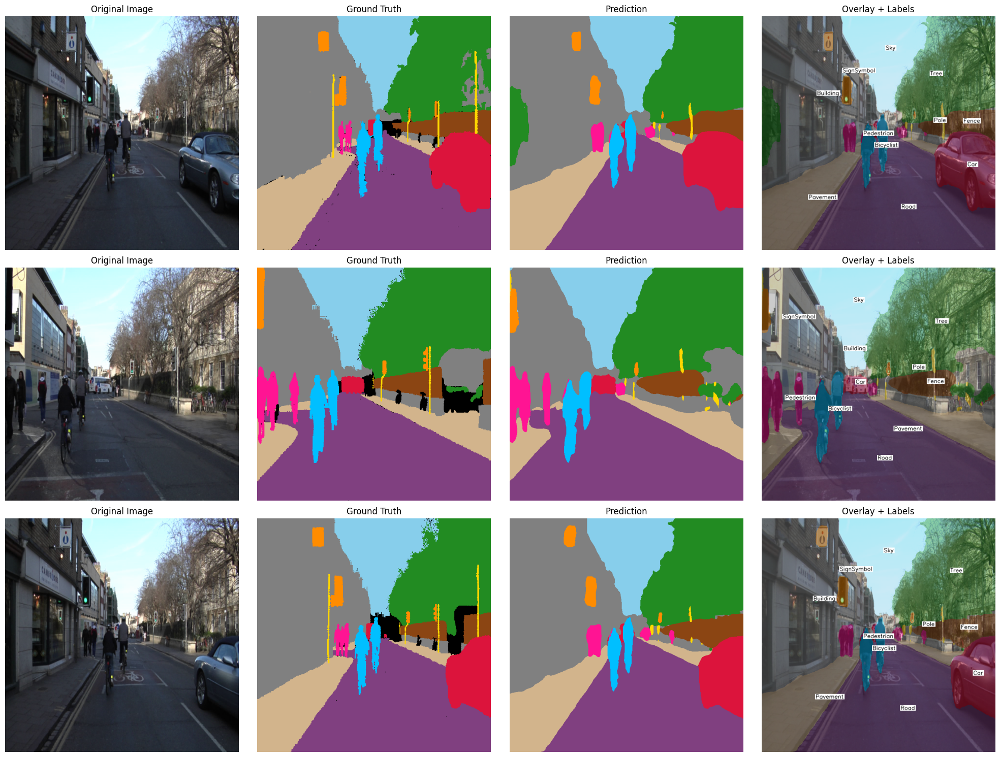

In [32]:
visualize_predictions_with_overlay(val_loader, model=model, num_images=3, min_area=100)

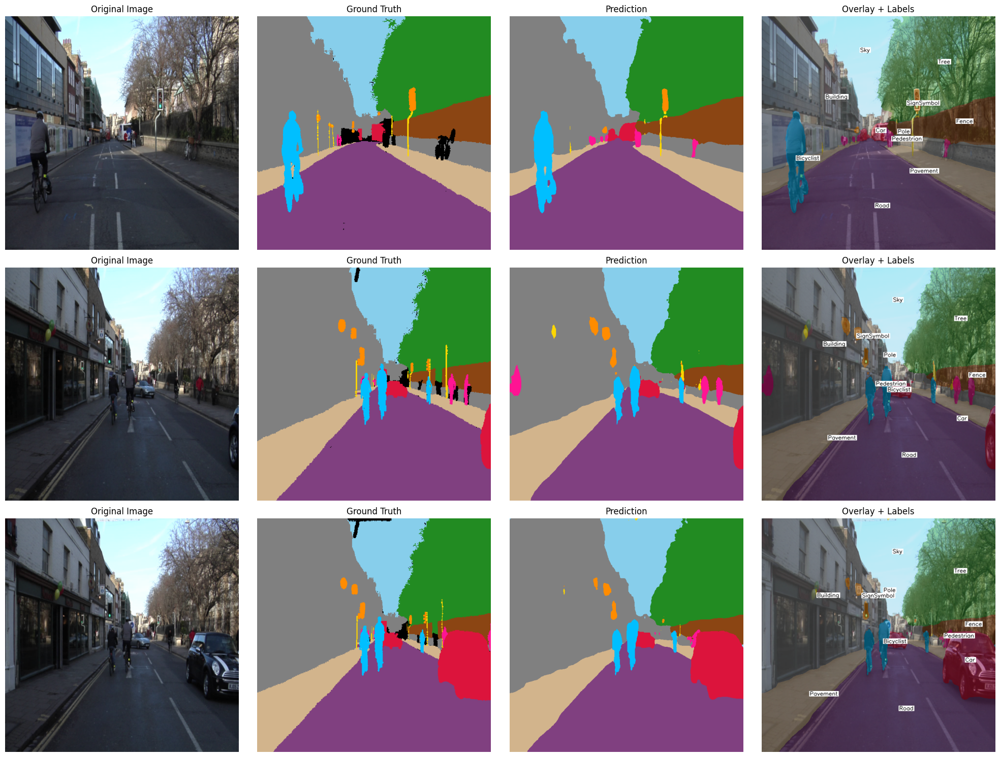

In [34]:
visualize_predictions_with_overlay(val_loader, model=modelT, num_images=3, min_area=100)

In [35]:
def visualize_predictions_with_range(
    data_loader,
    model=model,
    device=device,
    index_range=(0, 10),
    min_area=100
):
    """
    Visualize a specified range of images (by index) from the dataset.
    index_range: tuple (start_idx, end_idx) - will visualize images from start_idx to end_idx-1.
    """
    model.eval()
    all_images = []
    all_masks = []

    # Load full dataset from loader
    with torch.no_grad():
        for images, masks in data_loader:
            all_images.append(images)
            all_masks.append(masks)

    all_images = torch.cat(all_images, dim=0)
    all_masks = torch.cat(all_masks, dim=0)

    total_samples = all_images.shape[0]
    start_idx, end_idx = index_range

    # Validate range
    if start_idx < 0 or end_idx > total_samples or start_idx >= end_idx:
        print(f"Invalid index_range! Total samples: {total_samples}")
        return

    selected_indices = list(range(start_idx, end_idx))
    num_images = len(selected_indices)

    fig, axs = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))

    if num_images == 1:
        axs = np.expand_dims(axs, axis=0)  # Ensure 2D axs for single row case

    with torch.no_grad():
        for row_idx, idx in enumerate(selected_indices):
            image = all_images[idx].to(device).unsqueeze(0)
            output = model(image)
            pred_mask = torch.argmax(output, dim=1).cpu().squeeze(0).numpy()

            img_np = unnormalize(all_images[idx])
            gt_mask_np = all_masks[idx].cpu().numpy()

            overlay_np = overlay_mask_on_image(img_np, pred_mask)
            overlay_np = add_class_labels_to_overlay(overlay_np, pred_mask, min_area=min_area)

            axs[row_idx, 0].imshow(img_np)
            axs[row_idx, 0].set_title(f"Image idx {idx}")
            axs[row_idx, 0].axis('off')

            axs[row_idx, 1].imshow(decode_mask(gt_mask_np))
            axs[row_idx, 1].set_title("Ground Truth")
            axs[row_idx, 1].axis('off')

            axs[row_idx, 2].imshow(decode_mask(pred_mask))
            axs[row_idx, 2].set_title("Prediction")
            axs[row_idx, 2].axis('off')

            axs[row_idx, 3].imshow(overlay_np)
            axs[row_idx, 3].set_title("Overlay + Labels")
            axs[row_idx, 3].axis('off')

    plt.tight_layout()
    plt.show()

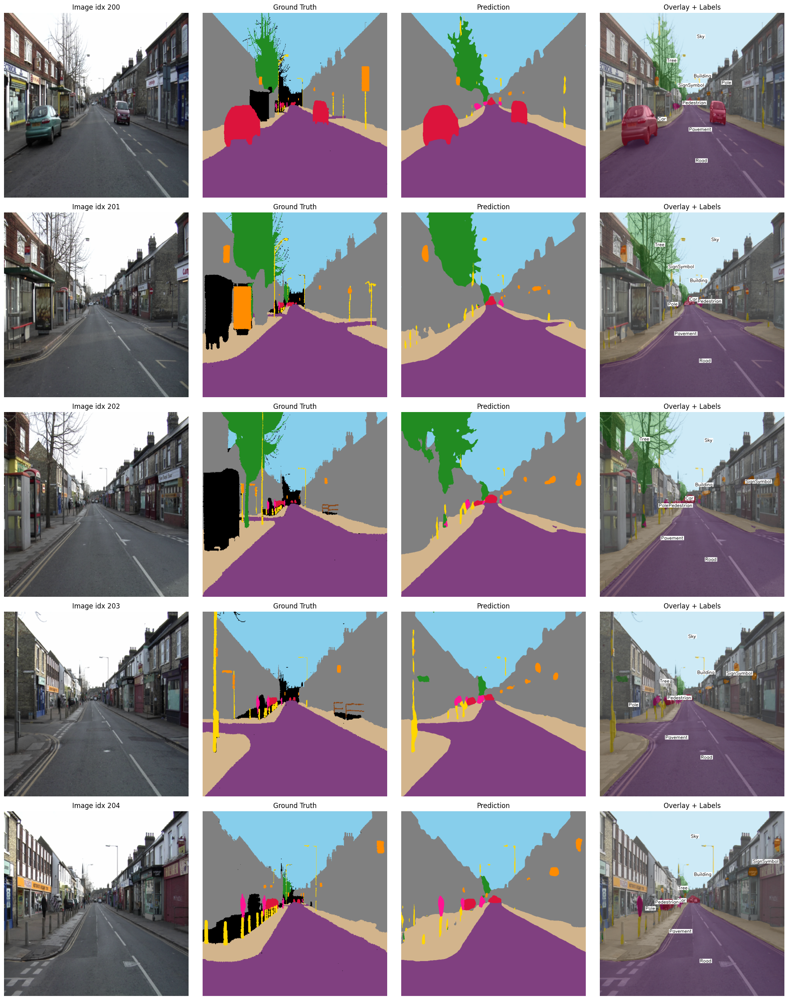

In [26]:
# Show images from index 10 to 19 (total 10 images)
visualize_predictions_with_range(
    data_loader=test_loader,
    model=model,
    device=device,
    index_range=(200, 205),
    min_area=100,
)

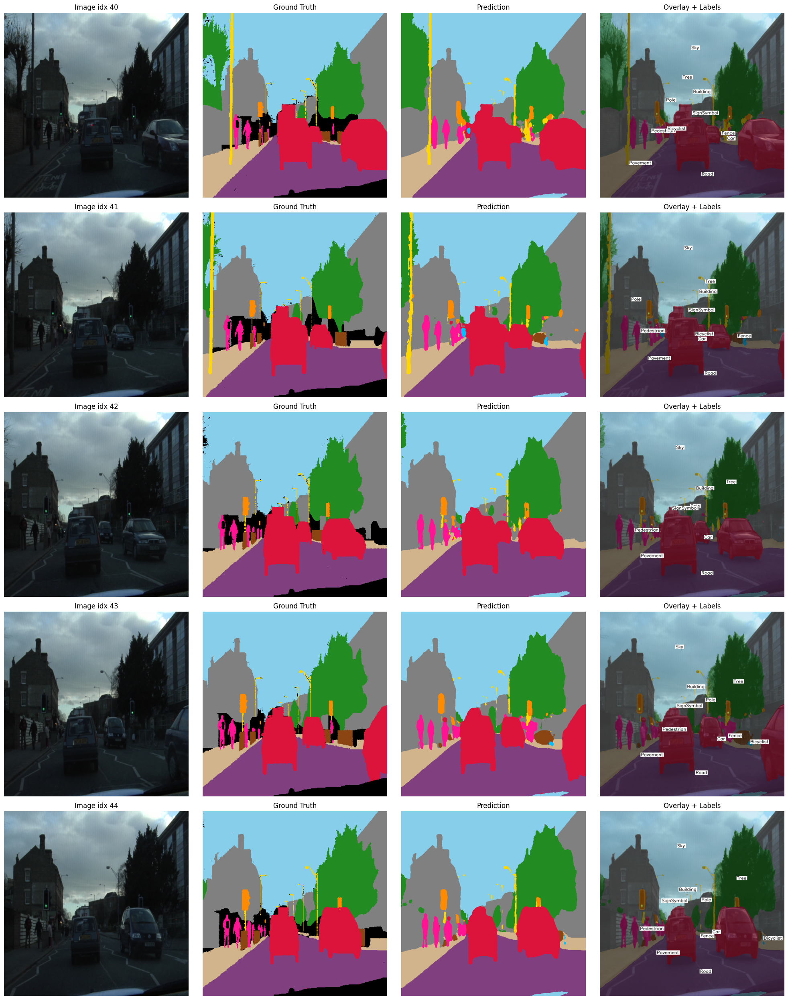

In [38]:
# Show images from index 10 to 19 (total 10 images)
visualize_predictions_with_range(
    data_loader=test_loader,
    model=modelT,
    device=device,
    index_range=(40, 45),
    min_area=100,
)

In [42]:
def visualize_comparison_two_models(
    data_loader,
    old_model,
    new_model,
    device="cuda",
    num_images=5,
    unnormalize_fn=unnormalize,
    decode_mask_fn=decode_mask,
):
    old_model.eval()
    new_model.eval()

    all_images = []
    all_masks = []

    # Collect all images and GT masks from loader
    with torch.no_grad():
        for images, masks in data_loader:
            all_images.append(images)
            all_masks.append(masks)
    all_images = torch.cat(all_images, dim=0)
    all_masks = torch.cat(all_masks, dim=0)

    total_samples = all_images.shape[0]
    selected_indices = random.sample(range(total_samples), min(num_images, total_samples))

    fig, axs = plt.subplots(len(selected_indices), 4, figsize=(20, 5 * len(selected_indices)))

    if len(selected_indices) == 1:
        axs = np.expand_dims(axs, axis=0)  # Fix for single sample case

    with torch.no_grad():
        for row_idx, idx in enumerate(selected_indices):
            image = all_images[idx].to(device).unsqueeze(0)

            # Old model prediction
            old_output = old_model(image)
            old_pred_mask = torch.argmax(old_output, dim=1).cpu().squeeze(0).numpy()

            # New model prediction
            new_output = new_model(image)
            new_pred_mask = torch.argmax(new_output, dim=1).cpu().squeeze(0).numpy()

            # Unnormalize original image if needed
            img_np = unnormalize_fn(all_images[idx]) if unnormalize_fn else all_images[idx].cpu().numpy().transpose(1, 2, 0)

            # Get GT mask
            gt_mask_np = all_masks[idx].cpu().numpy()

            axs[row_idx, 0].imshow(img_np)
            axs[row_idx, 0].set_title("Original Image")
            axs[row_idx, 0].axis('off')

            axs[row_idx, 1].imshow(decode_mask_fn(gt_mask_np))
            axs[row_idx, 1].set_title("Ground Truth")
            axs[row_idx, 1].axis('off')

            axs[row_idx, 2].imshow(decode_mask_fn(old_pred_mask))
            axs[row_idx, 2].set_title("FPN Model Prediction")
            axs[row_idx, 2].axis('off')

            axs[row_idx, 3].imshow(decode_mask_fn(new_pred_mask))
            axs[row_idx, 3].set_title("SegFormer Model Prediction")
            axs[row_idx, 3].axis('off')

    plt.tight_layout()
    plt.show()

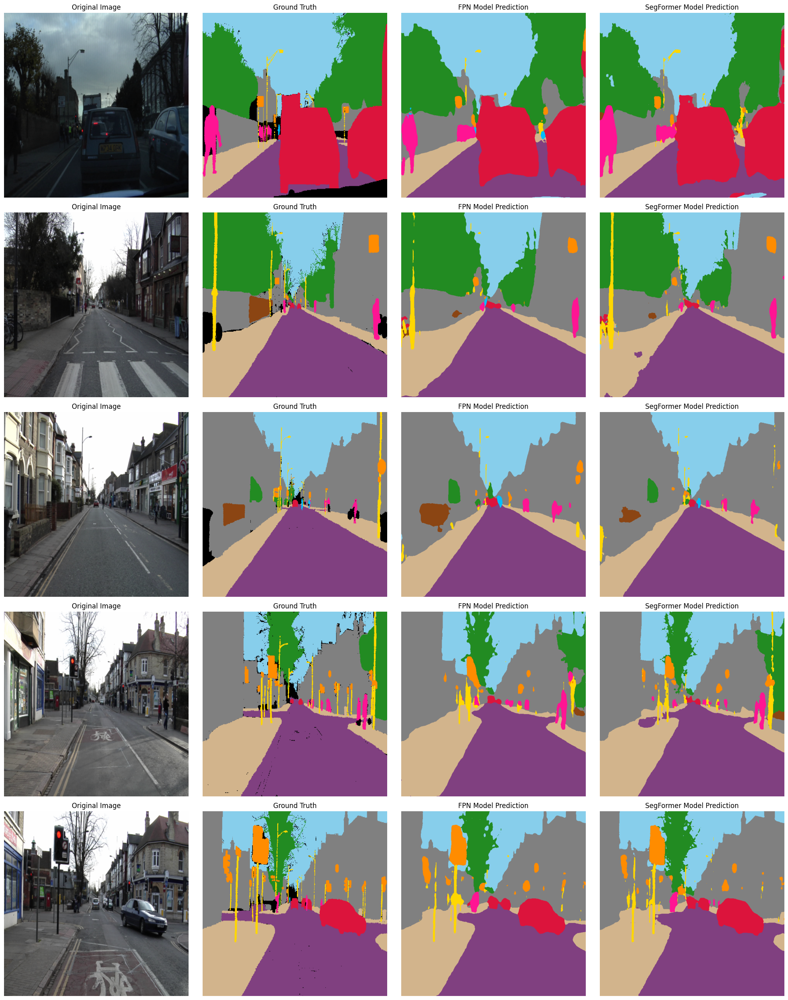

In [50]:
visualize_comparison_two_models(
    data_loader=test_loader,
    old_model=model,
    new_model=modelT,
    num_images=5,
)